In [34]:
env = 'local' # 'local' or 'colab'

In [35]:
if env == 'colab':  
    !pip install ipynb
    !pip install huggingface-hub
    !pip install datasets
    !pip install nltk
    !pip install transformers
    !pip install umap-learn

In [1]:
import pandas as pd
import numpy as np
import pickle

In [2]:
from Daily_Dialog_loader import get_DailyDialog

Getting Daily Dialog dataset

In [131]:
df_train = get_DailyDialog()

Using custom data configuration default
Reusing dataset daily_dialog (/home/minne/.cache/huggingface/datasets/daily_dialog/default/1.0.0/c03444008e9508b8b76f1f6793742d37d5e5f83364f8d573c2747bff435ea55c)


df_train will have following columns:
- utter_hashed - hash for an utterance
- utter - individual utterance
- dialog_id - list of diaolog ids in which this utterance exists
- utter_in_dialog - list of utterance positions positions in the dialog from dialog_id column

In [132]:
df_train.head()

,utter_hashed,utter,dialog_id,utter_in_dialog
0,-9223298557473896498,It is ok with me . So I will be arriving at y...,[4774],[4]
1,-9223225588991516678,Pretty good . What brings you here ?,[1509],[4]
2,-9223028000331363235,I want to buy some records .,[6242],[1]
3,-9222930676007796238,But IQ is decided at birth.One can't expect t...,[827],[6]
4,-9222883908738281256,How long have you been in China ?,[1916],[0]


## Normalizing utterances
Replace abbreviations to 'abr', phone numbers to 'somephonenumber', spelling of names to 'somespelling'. \
Turn all letters to lower case.\
Remove stop words. \
Lemmatize words.


In [133]:
import nltk
from nltk.corpus import stopwords
from nltk.stem import wordnet
from nltk import pos_tag
from sklearn.feature_extraction.text import TfidfVectorizer
import re

if env == 'colab': 
    nltk.download('stopwords')
    nltk.download('averaged_perceptron_tagger')
    nltk.download('wordnet')
    nltk.download('omw-1.4')
    nltk.download('punkt')

In [134]:
def rm_stop_words(tokens, stp_w = stopwords.words('english')):
    clean = []
    for w in tokens:
        if w not in stp_w:
            clean.append(w)
    return clean

r_spell = re.compile('([a-z]-[a-z]-?)+')
r_num =  re.compile('([0-9]-[0-9]- )+[0-9]')

def text_normalization(text, wo_stop_words = True):
    #norm_list = []
    text = re.sub('([A-Z]\s[.,]\s)+[A-Z]', 'abr', text) # substituting abbreviations and spelling
    text = text.lower()
    text = re.sub(r_spell,'somespelling', text) #substituting spelling of some words
    text = re.sub(r_num,'somephonenumber', text) #substituting phone numbers
    text = re.sub(r'[^a-z0-9\s]',' ',text) #removing punctuation
    text_tokens = nltk.word_tokenize(text)
    if wo_stop_words:
        text_tokens = rm_stop_words(text_tokens)
    lema = wordnet.WordNetLemmatizer()
    tags_list = pos_tag(text_tokens, tagset = None)
    lema_words = []
    for token, pos_token in tags_list:
        if pos_token.startswith('V'): #verb
            pos_val = 'v'
        elif pos_token.startswith('J'): #adj
            pos_val = 'a'
        elif pos_token.startswith('R'): #adv
            pos_val = 'r'
        else:
            pos_val = 'n' #noun
        lema_token = lema.lemmatize(token, pos_val)
        lema_words.append(lema_token)
    return ' '.join(lema_words)

In [135]:
df_train['dialog_norm'] = df_train['utter'].apply(text_normalization)

In [136]:
df_train.head()

,utter_hashed,utter,dialog_id,utter_in_dialog,dialog_norm
0,-9223298557473896498,It is ok with me . So I will be arriving at y...,[4774],[4],ok arrive office around two fifteen pm
1,-9223225588991516678,Pretty good . What brings you here ?,[1509],[4],pretty good brings
2,-9223028000331363235,I want to buy some records .,[6242],[1],want buy record
3,-9222930676007796238,But IQ is decided at birth.One can't expect t...,[827],[6],iq decide birth one expect make lot improvement
4,-9222883908738281256,How long have you been in China ?,[1916],[0],long china


## Dropping uninformative utterances

Because of the tokenization specific for tf-idf, some utterances vanish or become too short. I delet too short uttreances and numbers, because they cluster with any sentance.

In [137]:
empt_df = df_train[df_train.dialog_norm == '']

In [138]:
df_train.drop(empt_df.index, inplace = True)

In [139]:
short_df = df_train[df_train.dialog_norm.apply(lambda x: bool(len(x)==1))]
short_df

,utter_hashed,utter,dialog_id,utter_in_dialog,dialog_norm
11348,-6336762917080663412,just after 2 am .,[2911],[1],2
12142,-6146527830660812655,7,[10930],[5],7
13223,-5885554534205003676,$ 7 .,[11090],[3],7
14741,-5485645431609445905,$ 2 .,[7285],[5],2
17205,-4868588305587079052,It was after 2 am .,[8061],[2],2
26736,-2447019920921328697,$ 5 .,[9351],[3],5
36928,132903201349356472,About 6 .,"[2450, 10777]","[14, 7]",6
44135,1991046418147080595,It should be 3,[8796],[1],3
46157,2486558351957852877,At 8,[5711],[8],8
46602,2597283268424703756,It's us .,"[37, 2744, 2841]","[1, 1, 1]",u


In [140]:
df_train.drop(short_df.index, inplace = True)

In [141]:
df_train.shape[0]

71904

## TF-IDF vectorization

In [142]:
tfidf = TfidfVectorizer()

In [143]:
tf_idf_transformed = tfidf.fit_transform(df_train['dialog_norm']).toarray()

In [15]:
tf_idf_transformed

[array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]])]

In [148]:
dump = 0
if dump == 1:
    pickle.dump(tf_idf_transformed, open('./data/TF-IDF/tfidf_transformed_nr_utter.dat', 'wb'), protocol=4)

In [5]:
load = 1
if load == 1:    
    tf_idf_transformed = []
    with open('./data/TF-IDF/tfidf_transformed_nr_utter.dat', 'rb') as infile:
        while True:
            try:
                tf_idf_transformed .append(pickle.load(infile))
            except EOFError:
                break

In [156]:
print(tfidf.get_feature_names()[:20])

['00', '000', '007', '0085', '01', '010', '01088256798', '011', '01563', '01705', '0234', '04', '05', '050920', '053', '060', '075', '08', '09', '099']


/home/minne/.local/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.



Some tokens look strange. Should we remove numbers?

## Dimentionaliy reduction, visual exploration

In [9]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
%matplotlib inline
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
import umap 

In [15]:
import plotly.graph_objects as go
import plotly.express as px

#### PCA

In [21]:
pca = PCA(n_components = 3)
pca_result = pca.fit_transform(tf_idf_transformed)

In [28]:
dump = 1
    if dump == 1:
    pca_result.dump('./data/TF-IDF/tfidf_nr_pca_res.dat')

In [ ]:
load =0
if load == 1:
    pca_result = np.load('./data/TF-IDF/tfidf_nr_pca_res.dat', allow_pickle = True)

In [17]:
fig = px.scatter_3d(
    pca_result, x=0, y=1, z=2,
    labels={'0': 'PC 1', '1': 'PC 2', '2': 'PC 3'}
)
fig.update_traces(marker_size = 2)
fig.show()

In [18]:
fig.write_html('./data/TF-IDF/DD_tfidf_pca_3d.html')

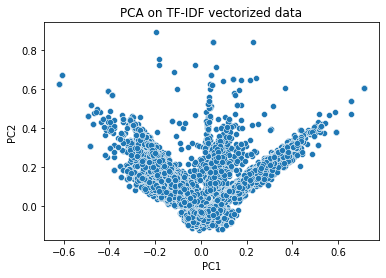

In [10]:
ax = sns.scatterplot(
    x=pca_result[:,0], y=pca_result[:,1]
)
ax.set_title('PCA on TF-IDF vectorized data')
ax.set(xlabel='PC1', ylabel='PC2')
plt.show()

In [21]:
fig_pca = ax.get_figure()
fig_pca.savefig('./data/Tf-IDF/DD_tfidf_pca_2d.png')

#### UMAP

In [14]:
fit = umap.UMAP()
u = fit.fit_transform(tf_idf_transformed[0])

In [ ]:
dump = 1
if dump == 1:
    u.dump('./data/TF-IDF/tfidf_umap_nr.dat')

In [24]:
load == 0
if load == 1:
    u = np.load('./data/tfidf_umap_nr.dat', allow_pickle = True)

In [25]:
fit.get_params()

{'a': None,
 'angular_rp_forest': False,
 'b': None,
 'dens_frac': 0.3,
 'dens_lambda': 2.0,
 'dens_var_shift': 0.1,
 'densmap': False,
 'disconnection_distance': None,
 'force_approximation_algorithm': False,
 'init': 'spectral',
 'learning_rate': 1.0,
 'local_connectivity': 1.0,
 'low_memory': True,
 'metric': 'euclidean',
 'metric_kwds': None,
 'min_dist': 0.1,
 'n_components': 2,
 'n_epochs': None,
 'n_jobs': -1,
 'n_neighbors': 15,
 'negative_sample_rate': 5,
 'output_dens': False,
 'output_metric': 'euclidean',
 'output_metric_kwds': None,
 'precomputed_knn': (None, None, None),
 'random_state': None,
 'repulsion_strength': 1.0,
 'set_op_mix_ratio': 1.0,
 'spread': 1.0,
 'target_metric': 'categorical',
 'target_metric_kwds': None,
 'target_n_neighbors': -1,
 'target_weight': 0.5,
 'tqdm_kwds': {'desc': 'Epochs completed',
  'bar_format': '{desc}: {percentage:3.0f}%| {bar} {n_fmt}/{total_fmt} [{elapsed}]',
  'disable': True},
 'transform_mode': 'embedding',
 'transform_queue_size'

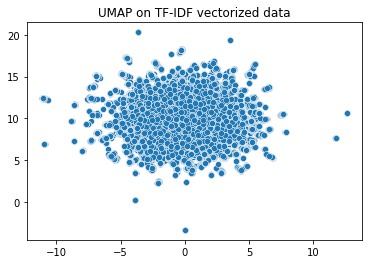

In [25]:
ax1 = sns.scatterplot(
    x=u[:,0], y=u[:,1]
)
ax1.set_title('UMAP on TF-IDF vectorized data')
plt.show()

In [26]:
fig_umap = ax.get_figure()
fig_umap.savefig('./data/TF-IDF/DD_tfidf_umap.png')

### Clustering

#### kNN

In [53]:
from sklearn.neighbors import NearestNeighbors

In [62]:
knn = NearestNeighbors(n_neighbors=15)

In [69]:
knn.fit(tf_idf_transformed)

NearestNeighbors(n_neighbors=15)

In [70]:
_, neighbours = knn.kneighbors([tf_idf_transformed[40]])

In [71]:
neighbours = df_train.iloc[neighbours[0].tolist()]['utter']

In [72]:
for n in neighbours:
    print(f"|{n}|")

| Does it bother you when you have to chew a lot ? |
| No , don't bother . |
| No . don ’ t bother . |
| What is bothering you ? |
| Don't bother . |
| No , don ’ t bother . It ’ s all right as it is . |
| What are you going to do ? Call my boss and chew him out ? |
| There will be 4 of us . |
| Don ’ t bother . I will help myself . |
| I'm sorry . Has it been bothering you ? |
| I'm sorry to have bothered you . |
| She's always bothering me . What should I do ? |
| Thank you . But I don't think I'll bother . |
| No , don't bother . I think I'm OK . |
|What's bothering that guy ? |


In [112]:
df_train.iloc[40].utter

' Does it bother you when you have to chew a lot ? '

#### K-means

In [73]:
from sklearn.cluster import KMeans

In [102]:
ssd = [] # Sum of squared distances
n_clust = np.arange(1,100,10)
for clust in n_clust:
    km = KMeans(clust)
    km.fit(pca_result)
    ssd.append(km.inertia_)

Text(0.5, 1.0, 'k-Means on data vectorized by TF-IDF \n and dimnetionality reduction with PCA')

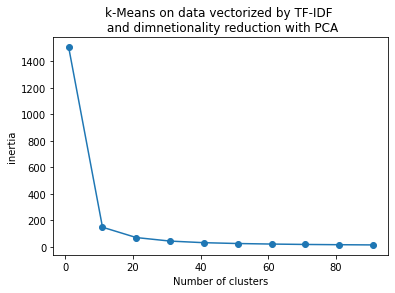

In [120]:
plt.plot(n_clust, ssd, marker = 'o' )
plt.xlabel('Number of clusters')
plt.ylabel('inertia')
plt.title('k-Means on data vectorized by TF-IDF \n and dimnetionality reduction with PCA')
plt.savefig('./data/TF-IDF/tfidf_pca_kmeans_elbow.png')

In [125]:
km = KMeans(12)
km.fit(pca_result)
labels = km.predict(pca_result)
df_train['pca_kmeans_label'] = labels

In [128]:
df_train[['utter', 'pca_kmeans_label']].to_excel('./data/tfidf_k12_means_clust.xlsx')